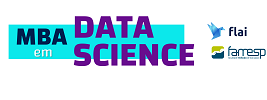

# **Taxa de Desocupação no Brasil**

## **Entendendo o contexto**

### **Desocupação no Brasil**

Vivemos no Brasil em um sistema capitalista onde que tem base na propriedade privada dos meios de produção e sua operação com fins lucrativos. Também deve ser elencado em nosso sistema econômico a acumulação de capital, troca voluntária, sistema de preço e também o trabalho assalariado.

Para entender o Mercado de Trabalho Brasileiro, o Instituto Brasileiro de Geografia e Estatística - IBGE, conduz a Pesquisa Nacional por Amostra de Domicílios Contínua, uma pesquisa que desde 2012 uniu a Pesquisa Mensal de Emprego e a Pesquisa Nacional por Amostra de Domicílio, e dentre diversas caracterísitca da população, mensura a taxa de desocupação.

De acordo com o IBGE: "O desemprego, de forma simplificada, se refere às pessoas com idade para trabalhar (acima de 14 anos) que não estão trabalhando, mas estão disponíveis e tentam encontrar trabalho. Assim, para alguém ser considerado desempregado, não basta não possuir um emprego."

Por exemplo, considere uma Jovem que Possui uma Delicatessen e:

- Seu filho Universitário que emprega todo seu tempo aos estudos da sua graduação;

- Sua mãe, que é Dona de Casa e que não realiza trabalho fora de casa;

- Seu esposo, que recentemente perdeu o emprego e busca a recolocação no Mercado de Trabalho;

- Um confeteiro que prepara as delícias da Delicatessen da Jovem.

Para o IBGE, na PNAD Contínua, O Universitário e a Senhora Dona de Casa serão considerados como fora da força do trabalho, a Jovem Empreendedora e o Confeiteiro seria considerada uma pessoa Ocupada, e o Esposo da Jovem que busca a recolocação seria uma pessoa Desocupada.

para entender melhor o Mercado de Trabalho pela ótica do IBGE, veja esta imagem abaixo:



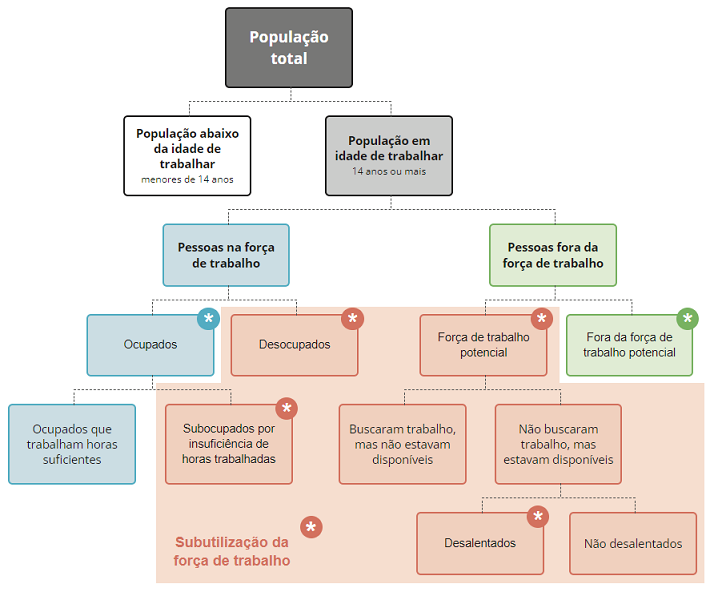

### **O Objetivo da Aula**

Apresentar uma visualização que demonstre a diferença da taxa de desocupação entre as grandes regiões do Brasil. 

### **O dataset**

O sistema IBGE de Recuperação Automática - SIDRA, é um aplicativo web excelente para obter dados e registros administrativos organizado pelo IBGE, como alguns indicadores oriundos da PNADC trimestral, como a taxa de desocupação, que pode ser acessado https://sidra.ibge.gov.br/pesquisa/pnadct/tabelas.

Nesses conjuntos de dados cada instância é um registro de uma taxa de desocupação em determinada região do Brasil em determinado trimestre, e possui 3 atributos:

- **TRIMESTRE:** Uma string que determina ano e trimestre da instância;
- **NM_REGIAO:** Qual grande região do Brasil pertence a instância;
- **TX_DESOCUPACAO:** Taxa de desocupação, em porcetagem, do trimestre em determinada região do Brasil;

Este conjunto já organizado em formato csv encontra-se disponível em:
- https://raw.githubusercontent.com/jonates/opendata/master/pnad_continua/pnadct_regiao.csv



### **O arquivo com dados geoespaciais**

Para realizar o Cartograma é preciso do arquivo georreferenciado que vai delimitar as regiões do Brasil.

Este arquivo em formato geojson encontra-se disponível em:
- https://github.com/jonates/opendata/raw/master/arquivos_geoespaciais/grandes_regioes.geojson


### **A Biblioteca Plotly**

Plotly é uma biblioteca que fornece diversos gráficos dinâmicos e interativos.

Para maiores informações do Plotly, consulte a documentação no endereço a seguir:

- https://plotly.com/

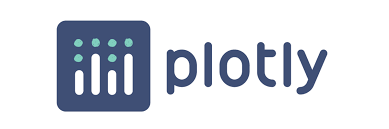

## **Hands-on**

1. **Preparar o ambiente**;
2. **Carregar dados**;
3. **Entender a estrutura dos dados**;
4. **Transformar dados**;
5. **Elaboração do Cartograma**.

### **Carregando o conjunto de dados**

In [1]:
# Fazendo download do conjunto de dados
!wget --verbose --show-progress --no-check-certificate https://raw.githubusercontent.com/jonates/opendata/master/pnad_continua/pnadct_regiao.csv


--2022-04-29 14:54:36--  https://raw.githubusercontent.com/jonates/opendata/master/pnad_continua/pnadct_regiao.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3930 (3.8K) [text/plain]
Saving to: ‘pnadct_regiao.csv’

pnadct_regiao.csv   100%[===================>]   3.84K  --.-KB/s    in 0s      

2022-04-29 14:54:37 (49.3 MB/s) - ‘pnadct_regiao.csv’ saved [3930/3930]



In [2]:
# Importando o Pandas
import pandas as pd

In [3]:
# Importando o conjunto de dados da PNAD Contínua
pnadc = pd.read_csv(
    filepath_or_buffer = '/content/pnadct_regiao.csv', 
    sep=';',
    decimal=','
)
pnadc.tail(20)

,TRIMESTRE,NM_REGIAO,TX_DESOCUPACAO
180,20211,Norte,15.0
181,20211,Nordeste,18.9
182,20211,Sudeste,15.3
183,20211,Sul,8.7
184,20211,Centro-Oeste,12.8
185,20212,Norte,14.1
186,20212,Nordeste,18.4
187,20212,Sudeste,14.6
188,20212,Sul,8.2
189,20212,Centro-Oeste,11.6


### **Espiando a estrutura dos dados**

In [4]:
# Informacoes gerais do conjunto de dados
pnadc.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   TRIMESTRE       200 non-null    int64  
 1   NM_REGIAO       200 non-null    object 
 2   TX_DESOCUPACAO  200 non-null    float64
dtypes: float64(1), int64(1), object(1)
memory usage: 4.8+ KB


### **Transformação do conjunto de dados**

In [5]:
# Filtrando somente o ultimo trimestre de 2021
pnadc_20214 = pnadc[pnadc['TRIMESTRE']==20214]

In [6]:
# Espiando o conjunto de dados filtrado
pnadc_20214

,TRIMESTRE,NM_REGIAO,TX_DESOCUPACAO
195,20214,Norte,11.2
196,20214,Nordeste,14.7
197,20214,Sudeste,11.2
198,20214,Sul,6.7
199,20214,Centro-Oeste,8.4


In [7]:
# Verificando a estrutura
pnadc_20214.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5 entries, 195 to 199
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   TRIMESTRE       5 non-null      int64  
 1   NM_REGIAO       5 non-null      object 
 2   TX_DESOCUPACAO  5 non-null      float64
dtypes: float64(1), int64(1), object(1)
memory usage: 160.0+ bytes


### **Carregando o arquivo com dados geoespaciais das regiões do Brasil**

In [8]:
# Fazendo download do conjunto de dados
!wget --verbose --show-progress --no-check-certificate https://github.com/jonates/opendata/raw/master/arquivos_geoespaciais/grandes_regioes.geojson


--2022-04-29 14:57:10--  https://github.com/jonates/opendata/raw/master/arquivos_geoespaciais/grandes_regioes.geojson
Resolving github.com (github.com)... 192.30.255.112
Connecting to github.com (github.com)|192.30.255.112|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/jonates/opendata/master/arquivos_geoespaciais/grandes_regioes.geojson [following]
--2022-04-29 14:57:11--  https://raw.githubusercontent.com/jonates/opendata/master/arquivos_geoespaciais/grandes_regioes.geojson
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 15047019 (14M) [text/plain]
Saving to: ‘grandes_regioes.geojson’

grandes_regioes.geo 100%[===================>]  14.35M  --.-KB/s    in 0.08s   

2022-04-29 14:57:11 (179 M

In [9]:
# Importando biblioteca necessária
import json

In [10]:
# Abrindo o JSON e guardando em um objeto
objeto_geo_regiao = open('/content/grandes_regioes.geojson',)

In [11]:
# Lendo o arquivo georreferenciado no formato JSON
geo_regiao = json.load(objeto_geo_regiao) 

In [12]:
# Espiando a estrutura
geo_regiao['features'][0]

{'geometry': {'coordinates': [[[[-47.31000618799998, -16.036273509501598],
     [-47.309951437, -16.03666664750158],
     [-47.310068852000036, -16.037065430501535],
     [-47.31029825100001, -16.03743713250156],
     [-47.31037543, -16.037562187501514],
     [-47.310433558000014, -16.037681612501537],
     [-47.31068358200001, -16.038195305501496],
     [-47.31090286599994, -16.03884696450159],
     [-47.31098537500002, -16.039092160501628],
     [-47.311315477999976, -16.039997801501688],
     [-47.31160441599999, -16.04059475750161],
     [-47.31216513700002, -16.041116043501574],
     [-47.31263227300004, -16.041674706501702],
     [-47.31267491200001, -16.042110662501624],
     [-47.31256598499997, -16.042448241501667],
     [-47.312202923999955, -16.042761288501723],
     [-47.311869565, -16.042796707501722],
     [-47.311536206000035, -16.04283212650172],
     [-47.31115025099999, -16.04279082950177],
     [-47.31059078599997, -16.04237863050177],
     [-47.310003330000036, -16.

In [ ]:
#from urllib.request import urlopen
#import json
#with urlopen('https://github.com/jonates/opendata/raw/master/arquivos_geoespaciais/grandes_regioes.geojson') as response:
#    geo_regiao = json.load(response)

#geo_regiao["features"][0]

### **Mapa com taxa de desocupação por 'Grandes Regiões' do Brasil no 4º trimestre de 2021**

In [13]:
# Importando as bibliotecas necessarias
import plotly.express as px

In [14]:
# Criando o mapa
mapa_desemprego_regiao = px.choropleth_mapbox(
    data_frame = pnadc_20214, 
    geojson = geo_regiao, 
    locations='NM_REGIAO', 
    featureidkey='properties.NM_REGIAO',
    color='TX_DESOCUPACAO',
    color_continuous_scale= 'blues',
    range_color=(5, 15),
    mapbox_style="open-street-map",
    zoom=2.5, 
    center = {"lat": -17.14, "lon": -57.33},
    opacity=1,
    labels={'TX_DESOCUPACAO':'Taxa de desocupação (em %)', 
            'NM_REGIAO' : 'Região do Brasil'
    },
    width = 800,
    height = 600

)

In [15]:
# Ajustando as margens
mapa_desemprego_regiao.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

# Exibindo o mapa
mapa_desemprego_regiao.show()

Para mais detalhes destes gráficos consulte a documentação oficial do Plotly através dos links:
- https://plotly.com/python/mapbox-county-choropleth/
- https://plotly.com/python-api-reference/generated/plotly.express.choropleth_mapbox.html
- https://plotly.com/python/colorscales/
- https://plotly.com/python/styling-plotly-express/


Para
https://plotly.com/python/colorscales/



### **Faça Você mesmo**

Construa um Cartograma com a taxa de desocupação entre as Unidades da Federação do Brasil, no quarto trimestre de 2012. Para tanto utilize os recursos disponibilizados nos links a seguir:

**Conjunto de dados** https://raw.githubusercontent.com/jonates/opendata/master/pnad_continua/pnadct_UF.csv

**Geojson com os polígonos das UFs** https://raw.githubusercontent.com/jonates/opendata/master/arquivos_geoespaciais/unidades_da_federacao.json